In [1]:
import osmnx as ox, networkx as nx, matplotlib.cm as cm, pandas as pd, numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd
import functools
import community

from scipy import sparse
from scipy.sparse import linalg
import time
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, mapping
from math import sqrt
import pandas as pd
from shapely.ops import cascaded_union
pd.set_option('precision', 10)

# Functions

In [2]:
def straightness_centrality(G, distance=False):

    if distance is True:
        distance='weight'
    
    path_length = functools.partial(nx.single_source_dijkstra_path_length, weight=distance)

    nodes = G.nodes()
    straightness_centrality = {}
    # TODO one request to get all the coordinates only
    # edges_coordinates = init_coordinates()

    # Initialize dictionary containing all the node id and coordinates
    # coord_nodes = get_nodes_coords(Node, Session)
    coord_nodes = nodes_dict(G)

    for n in nodes:
        straightness = 0
        sp = path_length(G,n)
        
        if len(sp) > 0 and len(G) > 1:
            # start computing the sum of euclidean distances
            source = {'x':coord_nodes.get(n)[0],'y':coord_nodes.get(n)[1]}
            # if the source is not a virtual node
            if source is not None:
                for target in sp:
                    if n != target and target in coord_nodes:
                        network_dist = sp[target]
                        euclidean_dist = euclidean_distance(*coord_nodes[n]+coord_nodes[target])
                        straightness = straightness + (euclidean_dist/network_dist)

                straightness_centrality[n]= straightness * (1.0/(len(G)-1.0) )
            # normalize to number of nodes-1 in connected part
#                 if normalized:
#                     if(len(sp))>2:
#                         s = (len(G)-1.0)/(len(sp)-1.0)
#                         straightness_centrality[n] = straightness_centrality[n] * s
#                     else:
#                         print(n)
#                         straightness_centrality[n] = 0.0
        else:
            straightness_centrality[n]=0.0

    return straightness_centrality


def euclidean_distance(xs, ys, xt, yt):
    """ xs stands for x source and xt for x target """
    return sqrt((xs - xt)**2 + (ys - yt)**2)

def nodes_dict(G):
    nodes_list = G.nodes(1)
    look = {}

    for i in range(0, len(nodes_list)):
        cod = nodes_list[i][0]
        x = nodes_list[i][1]['x']
        y = nodes_list[i][1]['y']
        look[cod] = (x,y)
    
    return look

def edge_straightness(G):
    edge_st = {}
    t = G.edges()
    for i in t:
         edge_st[i] = (nodes_df.get_value(i[0], "Cs_scaled")+nodes_df.get_value(i[1], "Cs_scaled"))/2
    
    return edge_st

import math
def dot(vA, vB):
    return vA[0]*vB[0]+vA[1]*vB[1]
def ang(lineA, lineB):
    # Get nicer vector form
    vA = [(lineA[0][0]-lineA[1][0]), (lineA[0][1]-lineA[1][1])]
    vB = [(lineB[0][0]-lineB[1][0]), (lineB[0][1]-lineB[1][1])]
    # Get dot prod
    dot_prod = dot(vA, vB)
    # Get magnitudes
    magA = dot(vA, vA)**0.5
    magB = dot(vB, vB)**0.5
    # Get cosine value
    cos_ = dot_prod/magA/magB
    # Get angle in radians and then convert to degrees
    angle = math.acos(dot_prod/magB/magA)
    # Basically doing angle <- angle mod 360
    ang_deg = math.degrees(angle)%360
    return ang_deg
     #if ang_deg-180<=0:
     #    return 180 - ang_deg
    # else:
     #    return ang_deg


# Geo Dataframe

In [3]:
#try reading Ordnance Survey corrected
streets = gpd.read_file('OS_manual_24.shp')

In [4]:
streets_BNG = streets.to_crs(epsg=27700)

In [5]:
streets_BNG_copy = streets_BNG
streets_BNG_copy['from'] = "NaN"
streets_BNG_copy['to'] = "NaN"

In [6]:
#removing Z coordinates and storing from/to coordinates

for index, row in streets_BNG_copy.iterrows():
    line = []
    line2 = []
    coord = list(row['geometry'].coords)
    from_node = coord[0][0:2]
    to_node = coord[-1][0:2]
    for i in range(0,len(coord)):
        point = coord[i][0:2]
        line.append(point)

    t = LineString([coor for coor in line])
    streets_BNG_copy.set_value(index,'geometry', t)
    streets_BNG_copy.set_value(index, 'from', from_node)
    streets_BNG_copy.set_value(index, 'to', to_node)

In [7]:
streets_BNG_tmp = streets_BNG_copy.drop(streets_BNG_copy[['endNode', 'fictitious','formOfWay','identifier','name1_lang',
                                                           'name2','name2_lang', 'loop','nameTOID', 'numberTOID','primary',
                                                           'roadNumber', 'startNode', 'trunkRoad']], axis=1)

In [8]:
#extracting nodes and greating a geodataframe
unique_nodes_tmp = list(streets_BNG_tmp['to'].unique()) + list(streets_BNG_tmp['from'].unique())
unique_nodes = list(set(unique_nodes_tmp))

crs = {'init': 'epsg:27700'}

In [9]:
nodes_data = pd.DataFrame.from_records(unique_nodes, columns=['x', 'y']).astype('float')
crs = {'init': 'epsg:27700'}
geometry = [Point(xy) for xy in zip(nodes_data.x, nodes_data.y)]

In [10]:
nodes_geo = gpd.GeoDataFrame(nodes_data, crs=crs, geometry=geometry)

In [11]:
nodes_tmp = nodes_geo.reset_index()
nodes_tmp['coordinates']=list(zip(nodes_tmp.x, nodes_tmp.y))

In [12]:
result_tmp = pd.merge(streets_BNG_tmp, nodes_tmp[['index', 'coordinates']], how='left', left_on="from", right_on="coordinates")
result_tmp = result_tmp.drop(result_tmp[['coordinates']],axis=1)
result_tmp = result_tmp.rename(columns = {'index':'u'})

In [13]:
result = pd.merge(result_tmp, nodes_tmp[['index', 'coordinates']], how='left', left_on="to", right_on="coordinates")
result = result.drop(result[['coordinates', 'from', 'to']],axis=1)
result = result.rename(columns = {'index':'v'})
result['key']=0 #for OSMNx

In [14]:
nodes_geo.gdf_name = 'Nodes_list' #for OSMNx

In [206]:
nodes_geo.head()

,x,y,geometry
0,529790.8337670626,179297.9595882815,POINT (532497.7637795184 182421.3382545242)
1,529767.0037692487,181173.9995897384,POINT (532840.5719969571 180293.9776482391)
2,532289.1037720862,182423.6995886319,POINT (529714.6793195654 181415.1693985005)
3,532992.3437691552,179598.0795858913,POINT (533098.0360368186 182488.8686786605)
4,531336.0037688409,180096.9995876313,POINT (531338.0594580972 179760.1375208735)


In [15]:
t = result[result.duplicated(result[['u','v']])]
t

,OBJECTID,Shape_Leng,class,function,geometry,length,name1,structure,u,v,key


In [82]:
result.head()

,OBJECTID,Shape_Leng,class,function,geometry,length,name1,structure,u,v,key,centroids,intersecting
0,1617,16.4107891340,A Road,A Road,LINESTRING (532546.0037722393 182434.999588431...,16.0,Old Street,,3350,1433,0,POINT (532497.7637795184 182421.3382545242),"[1608, 1618, 1623, 1628, 1629]"
1,352,133.5951015360,A Road,A Road,LINESTRING (532764.1537698696 180312.299586625...,16.0,Duke Street Hill,,3741,880,0,POINT (532840.5719969571 180293.9776482391),"[315, 468, 355, 648]"
2,3568,49.9799959984,Unclassified,Local Road,LINESTRING (529665.1337694078 181357.359589963...,50.0,Hanway Place,,2475,337,0,POINT (529714.6793195654 181415.1693985005),"[3565, 3567, 3577, 3579, 3580]"
3,1362,68.4105255059,A Road,A Road,LINESTRING (532979.0637726173 182557.049588170...,68.0,Great Eastern Street,,2772,3204,0,POINT (533098.0360368186 182488.8686786605),"[1531, 1532, 1363, 1355]"
4,880,161.4192362760,A Road,A Road,LINESTRING (531392.3737683927 179688.569587271...,1.0,Waterloo Road,,569,2433,0,POINT (531338.0594580972 179760.1375208735),"[874, 877, 891, 894, 895]"


In [16]:
check = result.loc[(result['u']==296) | (result['v']==296)]

In [66]:
result.OBJECTID = result.OBJECTID.astype(int)

In [67]:
# centroids for dual analysis

result_cn = result
result_cn['centroids'] = gpd.GeoSeries(result_cn['geometry'].centroid)

In [68]:
result_cn['intersecting'] = "NaN"
result_cn['intersecting'] = result_cn['intersecting'].astype(object)

In [71]:
#finding intersecgting edges

for index, row in result_cn.iterrows():
    intersections = []
    object_id = row['OBJECTID']
    from_node = row['u']
    to_node = row['v']
        
    tmp = result_cn.loc[(result_cn['u'] == from_node) |
                        (result_cn['u'] == to_node) |
                        (result_cn['v'] == to_node) |
                        (result_cn['v'] == from_node)]
    
    for i in tmp['OBJECTID']:
        if (i == object_id):
            continue
        else:
            intersections.append(i)  
    
    result_cn.set_value(index,'intersecting', intersections)

In [74]:
result_cn.head()

,OBJECTID,Shape_Leng,class,function,geometry,length,name1,structure,u,v,key,centroids,intersecting
0,1617,16.4107891340,A Road,A Road,LINESTRING (532546.0037722393 182434.999588431...,16.0,Old Street,,3350,1433,0,POINT (532497.7637795184 182421.3382545242),"[1608, 1618, 1623, 1628, 1629]"
1,352,133.5951015360,A Road,A Road,LINESTRING (532764.1537698696 180312.299586625...,16.0,Duke Street Hill,,3741,880,0,POINT (532840.5719969571 180293.9776482391),"[315, 468, 355, 648]"
2,3568,49.9799959984,Unclassified,Local Road,LINESTRING (529665.1337694078 181357.359589963...,50.0,Hanway Place,,2475,337,0,POINT (529714.6793195654 181415.1693985005),"[3565, 3567, 3577, 3579, 3580]"
3,1362,68.4105255059,A Road,A Road,LINESTRING (532979.0637726173 182557.049588170...,68.0,Great Eastern Street,,2772,3204,0,POINT (533098.0360368186 182488.8686786605),"[1531, 1532, 1363, 1355]"
4,880,161.4192362760,A Road,A Road,LINESTRING (531392.3737683927 179688.569587271...,1.0,Waterloo Road,,569,2433,0,POINT (531338.0594580972 179760.1375208735),"[874, 877, 891, 894, 895]"


In [207]:
nodes_centroids_data = result_cn[['OBJECTID', 'intersecting']]
crs = {'init': 'epsg:27700'}
geometry = result_cn['centroids']

In [208]:
nodes_centroids = gpd.GeoDataFrame(nodes_centroids_data, crs=crs, geometry=geometry)

In [209]:
nodes_centroids['x'] = [x.coords.xy[0][0] for x in result_cn['centroids']]
nodes_centroids['y'] = [y.coords.xy[1][0] for y in result_cn['centroids']]

In [242]:
nodes_cn = nodes_centroids.drop('intersecting', axis=1)
nodes_cn.gdf_name = 'Dual_list'
nodes_cn.head()

,OBJECTID,geometry,x,y
0,1617,POINT (532497.7637795184 182421.3382545242),532497.7637795184,182421.3382545242
1,352,POINT (532840.5719969571 180293.9776482391),532840.5719969571,180293.9776482391
2,3568,POINT (529714.6793195654 181415.1693985005),529714.6793195654,181415.1693985005
3,1362,POINT (533098.0360368186 182488.8686786605),533098.0360368186,182488.8686786605
4,880,POINT (531338.0594580972 179760.1375208735),531338.0594580972,179760.1375208735


In [231]:
junctions = pd.DataFrame(columns=['u','v', 'key', 'link', 'geometry'])

In [232]:
junctions.head()

,u,v,key,link,geometry


In [233]:
links = []

for index, row in nodes_centroids.iterrows():
    
    for i in row['intersecting']:
        index_v = nodes_centroids.OBJECTID[nodes_centroids.OBJECTID == i].index[0]

        if ((((index, index_v) in links) == False)
            & (((index_v, index) in links) == False)):
            
            junctions.loc[-1] = [index, index_v, 0, (index,index_v),  
                                 LineString([row['geometry'], nodes_centroids.loc[index_v]['geometry']])]  # adding a row
            junctions.index = junctions.index + 1 
                                        
            links.append((index, index_v))

In [234]:
junctions = junctions.sort_index(axis=0)

In [236]:
crs = {'init': 'epsg:27700'}
geometry = junctions['geometry']
junctions = gpd.GeoDataFrame(junctions[['u','v', 'key', 'link']], crs=crs, geometry=geometry)

In [237]:
junctions.head()

,u,v,key,link,geometry
0,5421,5422,0,"(5421, 5422)",LINESTRING (532490.9311807276 182699.140058840...
1,5419,5421,0,"(5419, 5421)",LINESTRING (532485.2150156108 182733.987264553...
2,5419,5420,0,"(5419, 5420)",LINESTRING (532485.2150156108 182733.987264553...
3,5418,5420,0,"(5418, 5420)",LINESTRING (532475.691261737 182762.8274396817...
4,5418,5419,0,"(5418, 5419)",LINESTRING (532475.691261737 182762.8274396817...


# OSMNx

In [18]:
G = ox.gdfs_to_graph(nodes_geo, result)

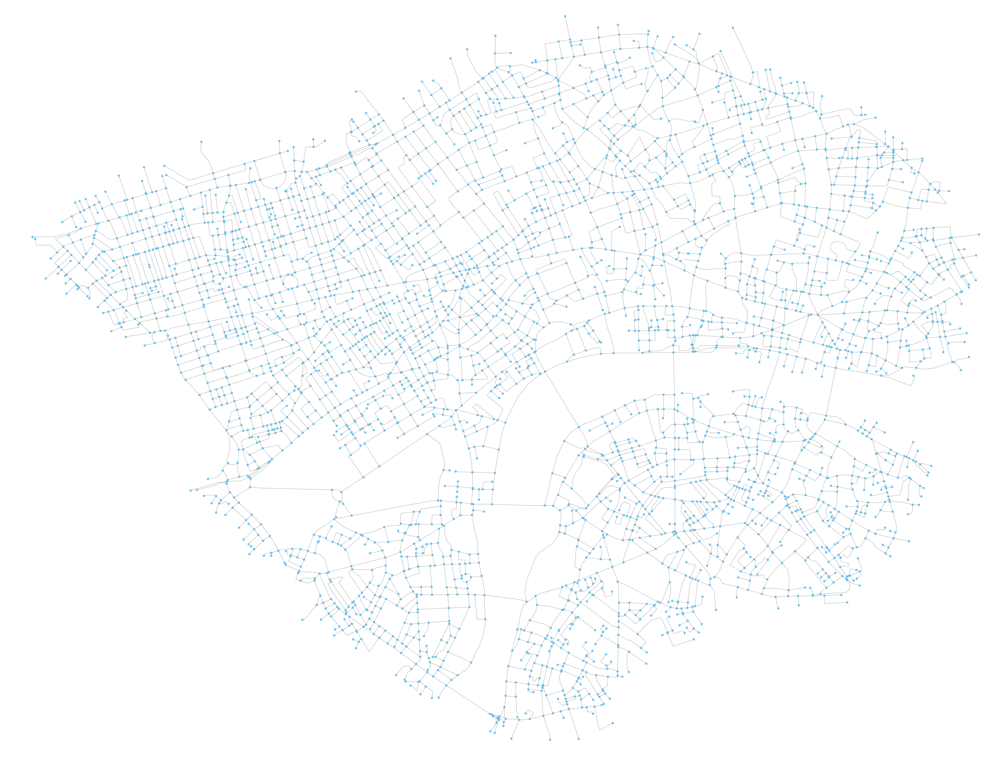

In [19]:
fig, ax = ox.plot_graph(G, fig_height=50, edge_linewidth=1, node_size = 70)

In [20]:
#removing edges represented only by nodes
for i in G.edges():
    if (i[0]==i[1]):
        print(i)
        G.remove_edge(i[0], i[1])

In [21]:
#checking for duplicate edges:
for i in G.edges():
    st=0
    for t in G.edges():
        
        if ((i[0]==t[1]) & (i[1]==t[0])):
            print(i,t)
        elif ((i[0]==t[0]) & (i[1]==t[1])):
            st=st+1
            if (st>1):
                print(i,t)
        

The history saving thread hit an unexpected error (OperationalError('database is locked',)).History will not be written to the database.


In [293]:
G.edge[0][3112][0]['OBJECTID']

4520.0

4519
4520
4518
3512
3517
3516
1589
1601
1582
951
954
947
410
411
408
3352
4213
3367
4220
2478
2212
519
510
520
4412
4421
4415
374
5691
6794
6804
6803
127
1171
1174
1170
135
140
133
139
309
2456
2458
3177
3180
3172
3181
1460
1325
1324
6442
6443
6440
180
182
181
3706
3713
3711
6381
6339
6380
6820
6821
6819
824
825
818
2854
2864
2857
1148
1155
1049
541
550
548
76
128
74
73
1388
1391
1339
1587
1585
1591
5042
4655
5032
4809
4768
4810
187
5001
1753
1695
1694
3562
3631
3560
6935
6936
6938
5338
5331
5337
7033
2840
2841
2816
151
154
152
1387
1389
479
487
489
5348
5349
5347
2618
2595
2612
6505
6516
6517
3961
3968
3969
2235
6003
6047
6050
1557
1809
1806
3769
3558
3772
1637
1641
1645
3355
3361
3354
3469
3614
3470
3465
474
478
4680
4683
4679
3215
5626
5739
5728
5742
6955
6963
6962
560
558
377
4457
137
2236
2821
2847
2850
1238
1242
1241
2983
2984
2978
865
722
864
3916
3918
3917
5871
5870
6015
1041
4521
4522
4513
4509
6807
6815
413
418
417
6937
4636
4623
4616
8
3581
3394
3393
3389
794
790
793
112
113

5737
5732
3126
2838
5284
5483
2803
2804
2112
210
211
1200
827
3136
3141
1675
1677
1680
712
1888
1896
5673
4413
4442
5987
6522
4985
4899
4900
6755
6757
1229
3138
3
1527
7
5985
4030
4043
6360
484
3336
3333
3332
5717
5718
6113
1594
651
4357
4363
4362
1063
3957
4093
4091
5489
5487
66
47
4355
4365
5172
45
34
2453
2440
2341
2446
3507
3518
3519
4732
6139
2403
5746
5748
5752
5413
1847
1598
4630
4628
6340
6411
6338
1185
1179
1181
586
592
2688
3665
4643
3779
3783
932
931
3496
3498
4273
4288
4481
2912
2910
3774
4534
4549
4112
4108
4110
1024
5211
2393
308
986
851
5652
5969
5984
1166
6001
6093
6094
6759
6763
6765
693
713
702
5203
6796
1097
1098
3412
3409
5556
5632
3604
3608
4233
4201
1723
6860
1468
1462
3830
1208
4207
3017
3020
3716
3343
3340
4515
4780
4788
4790
5165
5839
5771
1188
1189
6683
6872
2654
2057
3767
3758
3763
3513
5026
2051
2017
2056
2945
6421
6298
4463
4473
4467
5111
6571
6570
4414
4601
5750
5747
724
1360
4610
6779
6790
6789
6198
6210
6212
6211
207
4546
4552
2533
2526
2012
2211
4789
19

# Indexes computation

In [22]:
G = G.to_undirected()

In [23]:
Cb = nx.betweenness_centrality(G, k=None, normalized=True)

In [24]:
Ci = nx.current_flow_closeness_centrality(G)

In [25]:
Cs = straightness_centrality(G, distance=False) #already normalised

In [26]:
nodes_df = pd.DataFrame([Cb, Ci, Cs]).T
nodes_df.columns = ['d{}'.format(i) for i, col in enumerate(nodes_df, 1)]
nodes_df.columns = ["Cb", "Ci", "Cs"]

In [27]:
nodes_df['Cb_scaled'] = (nodes_df['Cb']-nodes_df['Cb'].min())/(nodes_df['Cb'].max()-nodes_df['Cb'].min())
nodes_df['Ci_scaled'] = (nodes_df['Ci']-nodes_df['Ci'].min())/(nodes_df['Ci'].max()-nodes_df['Ci'].min())
nodes_df['Cs_scaled'] = (nodes_df['Cs']-nodes_df['Cs'].min())/(nodes_df['Cs'].max()-nodes_df['Cs'].min())

In [39]:
# get a color for each node
def get_color_list(n, color_map='BuPu', start=-1, end=1):
    return [cm.get_cmap(color_map)(x) for x in np.linspace(start, end, n)]

In [40]:
def get_node_colors_by_stat(G, data, start=-1, end=1):
    df = pd.DataFrame(data=pd.Series(data).sort_values(), columns=['value'])
    df['colors'] = get_color_list(len(df), start=start, end=end)
    df = df.reindex(G.nodes())
    return df['colors'].tolist()

In [41]:
Cb_color = get_node_colors_by_stat(G, data=nodes_df['Cb_scaled'].to_dict())
Ci_color = get_node_colors_by_stat(G, data=nodes_df['Ci_scaled'].to_dict())
Cs_color = get_node_colors_by_stat(G, data=nodes_df['Cs_scaled'].to_dict())

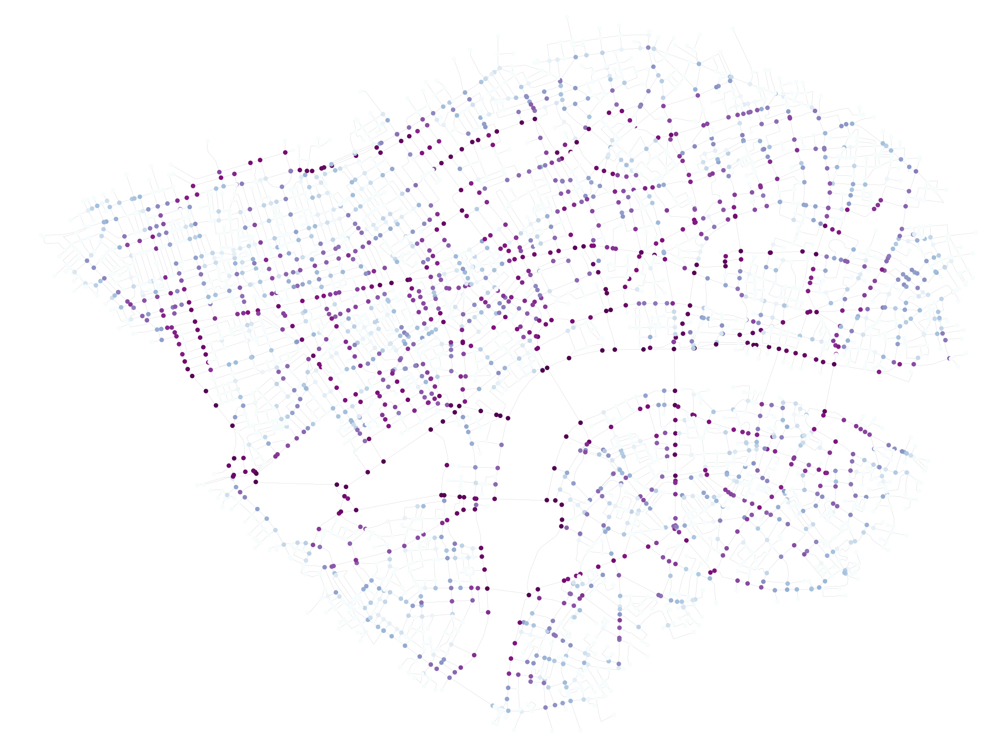

In [42]:
#show betweenness centrality
fig, ax = ox.plot_graph(G, node_color=Cb_color, edge_color='black',
                        node_size=100, node_zorder=2, fig_height=30, edge_linewidth=0.1)

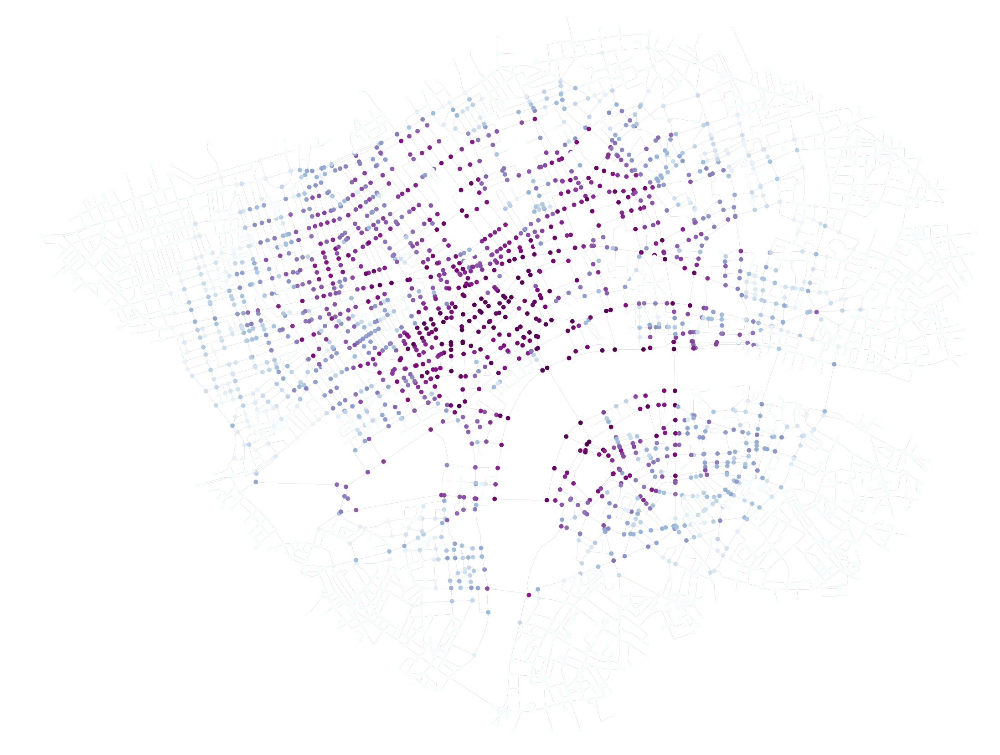

In [43]:
#show information centrality
fig, ax = ox.plot_graph(G, node_color=Ci_color, edge_color='black',
                        node_size=100, node_zorder=3, fig_height=30, edge_linewidth=0.1)

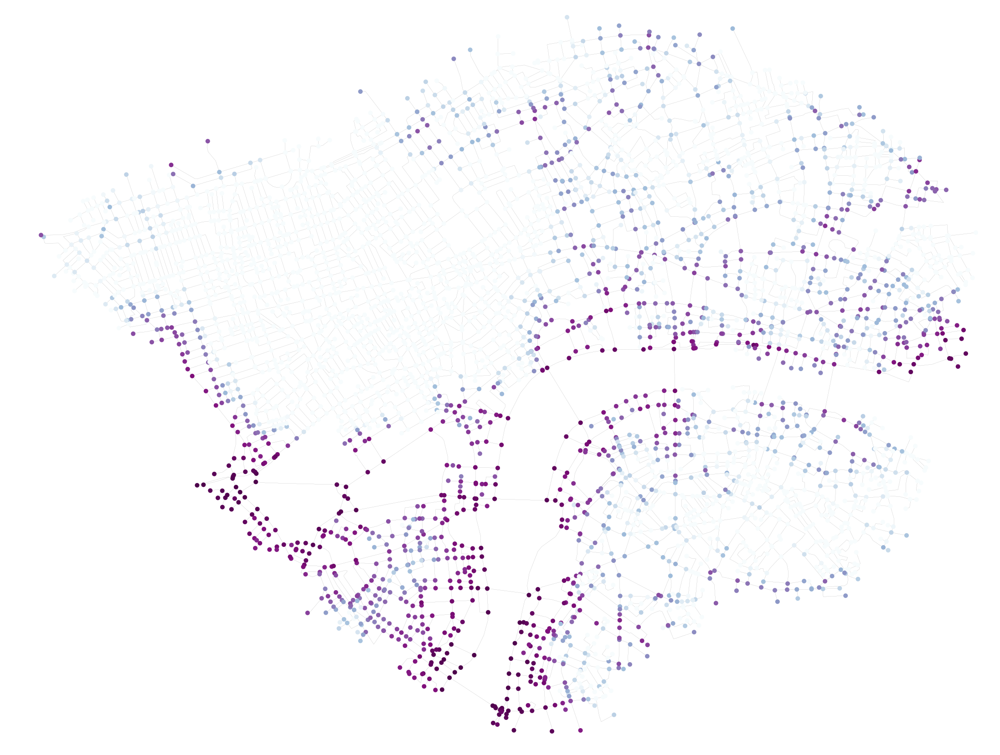

In [44]:
#show Straightness centrality
fig, ax = ox.plot_graph(G, node_color=Cs_color, edge_color='black',
                        node_size=100, node_zorder=2, fig_height=30, edge_linewidth=0.1)

In [34]:
# get a color for each node
def get_color_list(n, color_map='YlOrRd', start=-1, end=1):
    return [cm.get_cmap(color_map)(x) for x in np.linspace(start, end, n)]

def get_edge_colors_by_stat(G, data, start=-1, end=1):
    df = pd.DataFrame(data=pd.Series(data).sort_values(), columns=['value'])
    df['colors'] = get_color_list(len(df), start=start, end=end)
    df = df.reindex(G.edges())
    return df['colors'].tolist()

In [35]:
Eb = nx.edge_betweenness_centrality(G, normalized=True)

In [285]:
Eb

{(0, 2667): 0.0009251963709643445,
 (0, 3112): 0.0005208333333333333,
 (0, 481): 0.0001174855521348541,
 (1, 2804): 0.007979564212283116,
 (1, 2878): 0.008530964535020221,
 (1, 3177): 0.016061451724788078,
 (2, 128): 0.00045802089268771195,
 (2, 2210): 0.005259631955362443,
 (2, 2334): 0.005602127442399664,
 (3, 3521): 0.0003806021103310181,
 (3, 1609): 0.00023480576430312907,
 (3, 2202): 0.0008893863865962377,
 (4, 2872): 0.0013334956705242811,
 (4, 715): 0.0018659969512907772,
 (4, 3218): 0.00057323075746569,
 (5, 389): 0.019846717768948256,
 (5, 594): 0.008025870337925966,
 (5, 1951): 0.004014620241283784,
 (5, 2266): 0.023281797595844783,
 (6, 2039): 0.0005208333333333333,
 (7, 2820): 0.0005208333333333333,
 (8, 2831): 0.0014689246065905613,
 (8, 2424): 0.003364847197954762,
 (8, 2751): 0.0014713147652520692,
 (9, 2103): 0.00023115585040715703,
 (9, 1688): 0.0006835836272263232,
 (9, 1907): 0.0004937001189048996,
 (10, 486): 0.0005208333333333333,
 (11, 499): 0.0005208333333333333,

In [36]:
Eb_color = get_edge_colors_by_stat(G, data = Eb)
Es_color = get_edge_colors_by_stat(G, data = edge_straightness(G))

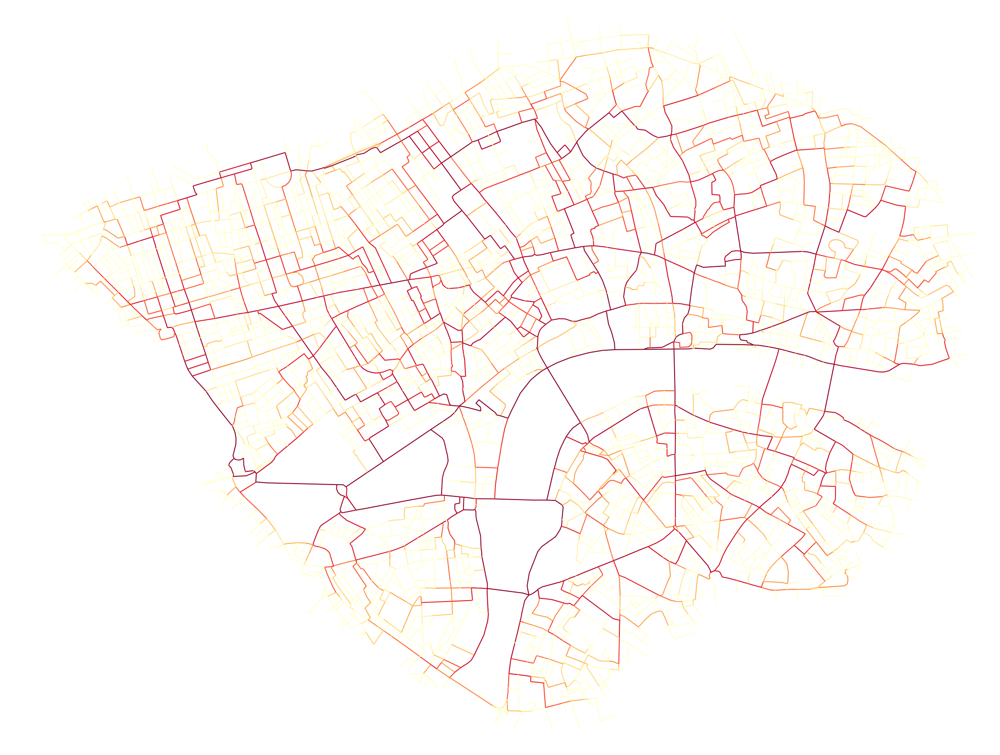

In [37]:
fig, ax = ox.plot_graph(G, node_color=None, edge_color=Eb_color,
                        node_size=0, node_zorder=2, fig_height=30, edge_linewidth=2)

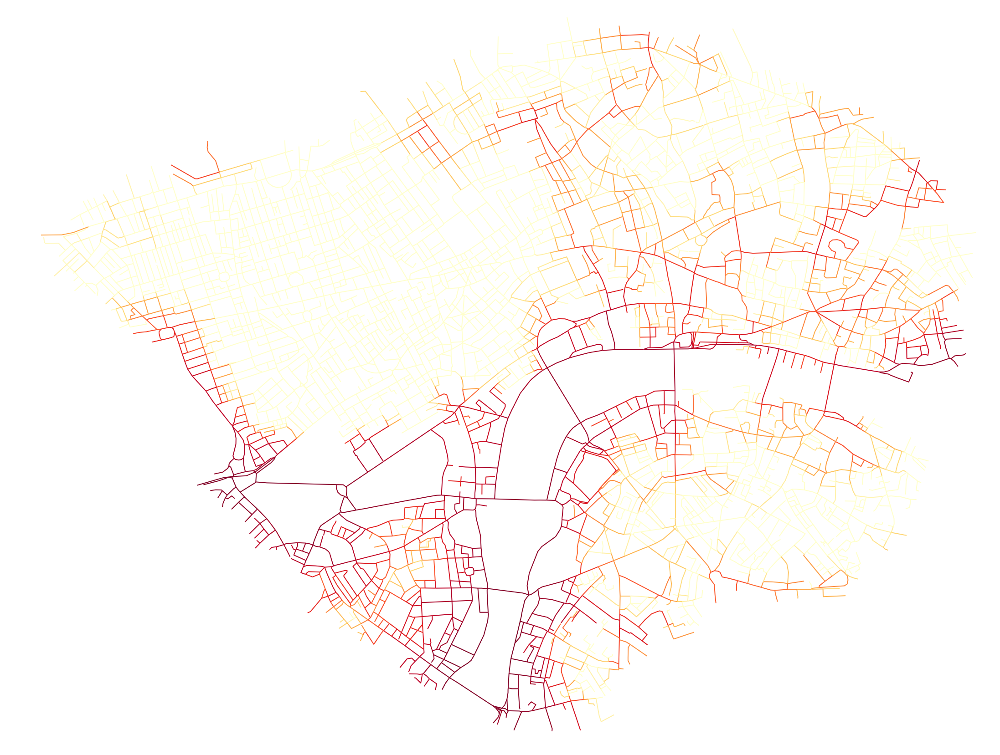

In [38]:
fig, ax = ox.plot_graph(G, node_color=None, edge_color=Es_color,
                        node_size=0, node_zorder=2, fig_height=30, edge_linewidth=2)

In [254]:
Gc = ox.gdfs_to_graph(nodes_cn, junctions)

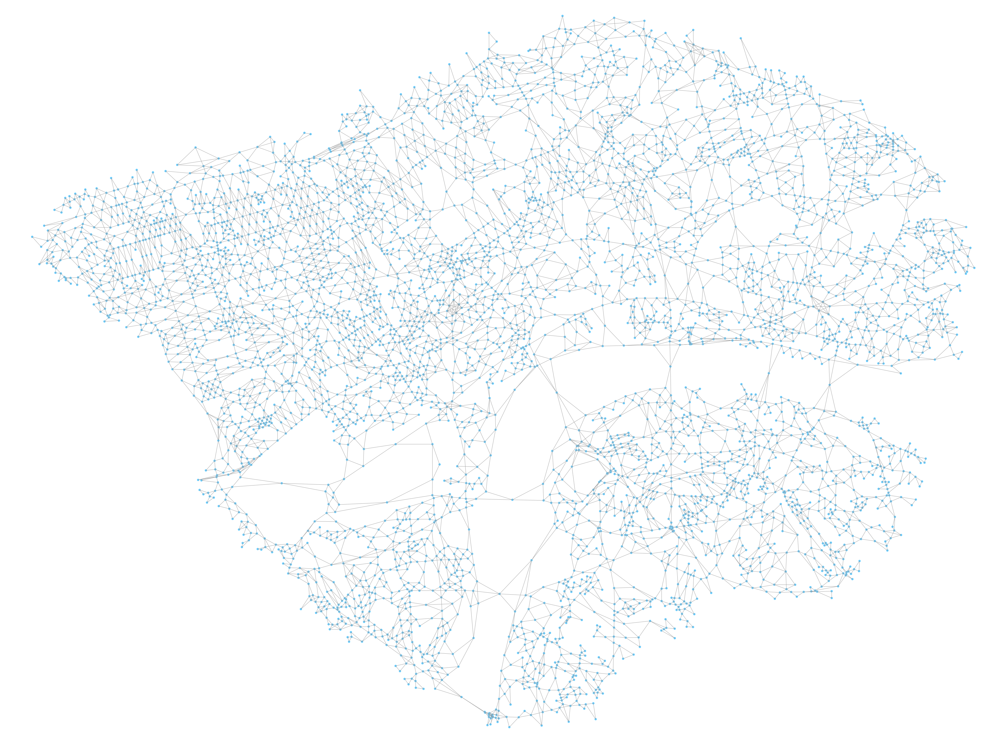

In [244]:
fig, ax = ox.plot_graph(Gc, fig_height=50, edge_linewidth=1, node_size = 70)

In [256]:
Gc = Gc.to_undirected()

In [275]:
Gc.nodes(1)[1]

(1,
 {'OBJECTID': 352,
  'geometry': <shapely.geometry.point.Point at 0x1af811445f8>,
  'x': 532840.57199695706,
  'y': 180293.97764823909})

# Natural Roads

In [70]:
lineA = ((530002.0437683944, 180335.6595889045),(530035.6433684696, 180384.0141889125))
lineB = ((530035.6433684696, 180384.0141889125),(529973.0037684409, 180388.919588969))
ang(lineA, lineB)

120.3160507267586

In [18]:
def natural_road(current_id, natural_id, direction):
        
    if (current_id ==0): #select a new road
        to_process = list(set(segments) - set(processed))
        to_process.sort()

        current_id = to_process[0]
        natural_id = counter+1
    else:
        natural_id = natural_id 
     
    angles = {}
    directions_dict = {}
    to_node = result.loc[current_id]['u']
    from_node = result.loc[current_id]['v']             
 
    x_t = float("{0:.10f}".format(nodes_geo.loc[to_node]['x']))
    y_t = float("{0:.10f}".format(nodes_geo.loc[to_node]['y']))
    x_f = float("{0:.10f}".format(nodes_geo.loc[from_node]['x']))
    y_f = float("{0:.10f}".format(nodes_geo.loc[from_node]['y']))
            
    if (direction == "to"): #continue from the to_node
        intersecting = result[(result['u']==to_node) | (result['v']==to_node)]
    elif (direction == "fr"): #continue from the from_node
        intersecting = result[(result['u']==from_node) | (result['v']==from_node)]
    else: #if direction doesn't matter:check everything  
        intersecting = result[(result['u']==to_node) | 
                                (result['v']==to_node) |
                                (result['u']==from_node) |
                                (result['v']==from_node)]
        
    ## No interesecting roads (it shouldn't happen)
    if (len(intersecting)==0): 
        processed.append(current_id)
        result.set_value(current_id, 'natural_id', natural_id)
        #recall the function
        natural_road(current_id=0, natural_id=natural_id, direction="zero")
        
    # otherwise, for each intersecting road, that hasn't been processed yet, compute the deflection angle
    else:
        for index, row in intersecting.iterrows(): 

            if ((current_id == index) | (index in processed)):
                continue
            
            else:
                to_node_F = result.loc[index]['u']
                from_node_F = result.loc[index]['v']
                     
                x_tf = float("{0:.10f}".format(nodes_geo.loc[to_node_F]['x']))
                y_tf = float("{0:.10f}".format(nodes_geo.loc[to_node_F]['y']))
                x_ff = float("{0:.10f}".format(nodes_geo.loc[from_node_F]['x']))
                y_ff = float("{0:.10f}".format(nodes_geo.loc[from_node_F]['y']))
                
                if (to_node == to_node_F):
                    lineA = ((x_f, y_f),(x_t,y_t))
                    lineB = ((x_tf, y_tf),(x_ff, y_ff))
                    direction = "fr"
                elif (to_node == from_node_F):
                    lineA = ((x_f, y_f),(x_t,y_t))
                    lineB = ((x_ff, y_ff),(x_tf, y_tf))
                    direction = "to"
                elif (from_node == from_node_F):
                    lineA = ((x_t, y_t),(x_f,y_f))
                    lineB = ((x_ff, y_ff),(x_tf, y_tf))
                    direction = "to"
                else: #(from_node == to_node_F)
                    lineA = ((x_t, y_t),(x_f,y_f))
                    lineB = ((x_tf, y_tf),(x_ff, y_ff))
                    direction = "fr"
                
                deflection = ang(lineA, lineB)
              
                
                if (deflection >= 45):
                    continue
                else:
                    angles[index]=deflection
                    directions_dict[index]=direction
                                 
        if (len(angles) == 0): #no natural continuations
            processed.append(current_id)
            result.set_value(current_id, 'natural_id', natural_id)
            #recall the function
            natural_road(current_id=0, natural_id=natural_id, direction="zero")

        else:
            processed.append(current_id)
            angles_sorted = sorted(angles, key=angles.get)
            best = angles_sorted[0]

            result.set_value(current_id, 'natural_id', natural_id)
            natural_road(best, natural_id, directions_dict[best])

In [20]:
import sys
# import threading

result = result.loc[0:1000]
# threading.stack_size(67108864*2) # 64MB stack
sys.setrecursionlimit(7000) # something real big
                               # you actually hit the 64MB limit first
                               # going by other answers, could just use 2**32-1

counter = 0
processed = []
segments = list(result.index.values)

# only new threads get the redefined stack size
# thread = threading.Thread(target=natural_road(0,0,"zero"))
#thread.start()

counter = 0
processed = []
segments = list(result.index.values)

natural_road(0,0,"zero")

IndexError: list index out of range

In [284]:
tt=result.loc[[3463, 3468]]

In [285]:
tt

,OBJECTID,Shape_Leng,class,function,geometry,length,name1,structure,u,v,key,natural_id
3463,5608.0,26.8700576851,Unclassified,Local Road,LINESTRING (529190.0037695102 181665.999590588...,27.0,Riding House Street,,3267,564,0,NaN
3468,5616.0,14.1421356237,Unclassified,Local Road,LINESTRING (529200.0037695272 181675.999590589...,14.0,Riding House Street,,2373,3267,0,NaN


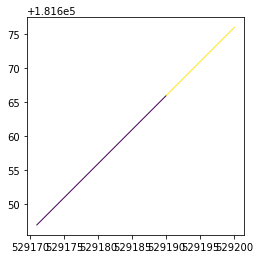

In [286]:
tt.plot()

In [287]:
for i in tt['geometry']:
    print(i)

LINESTRING (529190.0037695102 181665.9995905881, 529180.5037694939 181656.4995905887, 529171.0037694775 181646.9995905896)
LINESTRING (529200.0037695272 181675.9995905893, 529195.0037695188 181670.9995905869, 529190.0037695102 181665.9995905881)


In [92]:
s=nodes_geo[nodes_geo['x']==529824.00376860122]
s

,x,y,geometry
1754,529824.003769,180594.999589,POINT (529824.0037686012 180594.9995892482)


In [193]:
tt = result.loc[(result['u'] ==2972) | (result['v'] ==2972) ]

In [ ]:
(529190.0037695102 181665.9995905881, 529180.5037694939 181656.4995905887, 529171.0037694775 181646.9995905896)
LINESTRING (529200.0037695272 181675.9995905893, 529195.0037695188 181670.9995905869, 529190.0037695102 181665.9995905881)

In [25]:
lineA = ((529171.00376947752, 181646.9995905896), (529190.003769510222, 181665.999590588122))
lineB = ((529190.003769510222, 181665.999590588122), (529200.0037695272, 181675.9995905893))
ang(lineA, lineB)

0.0

# NetworkX

In [277]:
pos = {}

for i in range(0,len(Gc.nodes(1))):
        coor = (Gc.nodes(1)[i][1]['x'],Gc.nodes(1)[i][1]['y'], Gc.nodes(1)[i][1]['OBJECTID'] )
        pos[i]=coor

In [261]:
Ng = nx.Graph() #Empty graph

Ng.add_nodes_from(pos.keys()) #Add nodes preserving coordinates

In [279]:
for i in range(0,len(Ng.nodes())):
    Ng.node[i]['x']=pos[i][0]
    Ng.node[i]['y']=pos[i][1]
    Ng.node[i]['OBJECTID']=pos[i][2]

In [263]:
for i in list(Gc.edges()):
    Ng.add_edge(i[0], i[1])

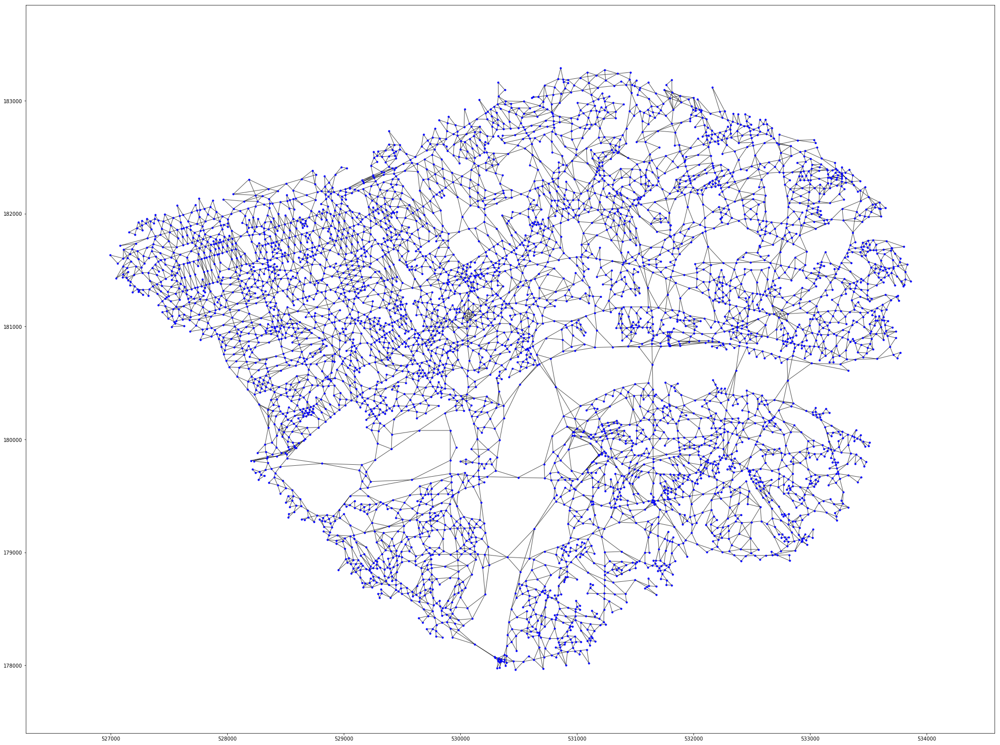

In [264]:
plt.figure(figsize=(35,27))
nx.draw_networkx_nodes(Gc,pos,node_size=10,node_color='b')
nx.draw_networkx_edges(Gc,pos, alpha=0.7)

In [552]:
Gn = Gn.to_undirected()

In [283]:
partition = community.best_partition(Ng)

In [316]:
list_edges = list(G.edges_iter(data=True))
edge_part = {}

for i, value in partition.items():
    edge_id = Ng.node[i]['OBJECTID']

    for v in list_edges:
        index = (v[0],v[1])
        orig = int(v[2]['OBJECTID'])
        
        if (orig != edge_id):
            continue
        else:
            edge_part[index]=value
            break
    

In [318]:
import pylab
import random

n=(max(partition.values()))+1
cm = pylab.get_cmap('nipy_spectral')

In [319]:
cgen = list(cm(1.*i/n) for i in range(n))

In [320]:
random.shuffle(cgen)

In [594]:
for u,v,d in Gn.edges(data=True):
    d['color']=cgen[d['partition']]

In [596]:
colors = [Gn[u][v]['color'] for u,v in edges]
part = [Gn[u][v]['partition'] for u,v in edges]

C:\Users\gabri\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
C:\Users\gabri\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
C:\Users\gabri\Anaconda3\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
C:\Users\gabri\Anaconda3\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in

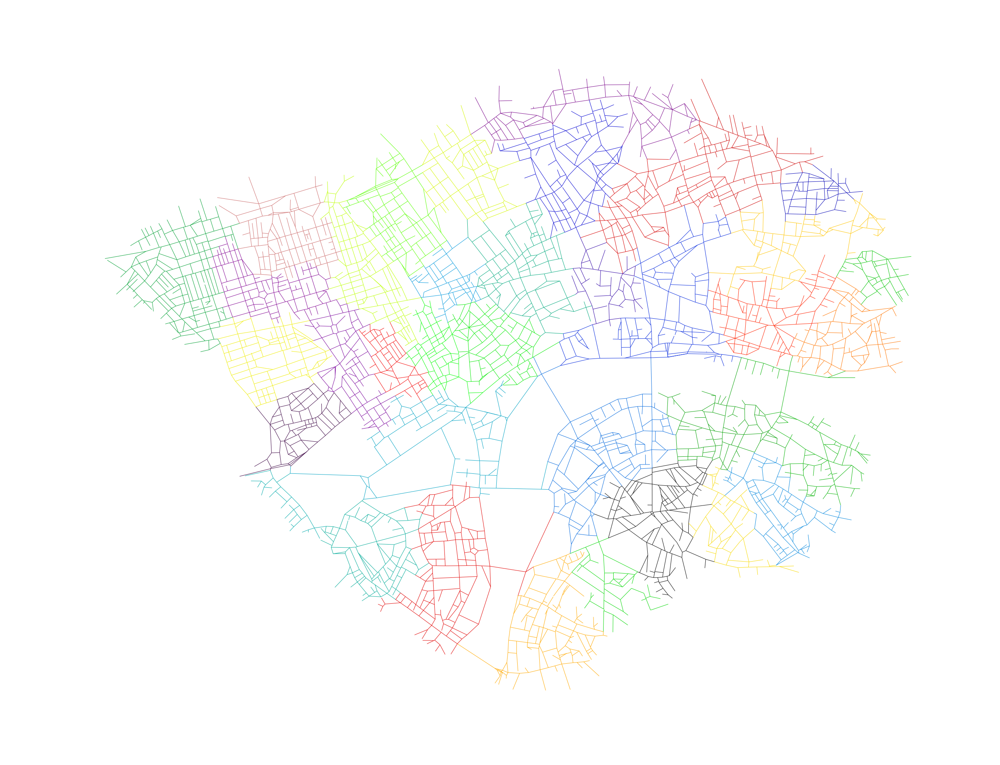

In [597]:
plt.figure(figsize=(35,27))
nx.draw(Gn,pos,alpha=1, node_size=0,edge_color=colors)

In [ ]:
fig, ax = ox.plot_graph(G, node_color=None, edge_color=Es_color,
                        node_size=0, node_zorder=2, fig_height=30, edge_linewidth=2)

# Buffered

In [ ]:
def clean_intersections_short(G, tolerance, dead_ends=False):

    # if dead_ends is False, discard dead-end nodes to only work with edge intersections
    if not dead_ends:
        if 'streets_per_node' in G.graph:
            streets_per_node = G.graph['streets_per_node']
        else:
            streets_per_node = count_streets_per_node(G)

        dead_end_nodes = [node for node, count in streets_per_node.items() if count <= 1]
        G = G.copy()
        G.remove_nodes_from(dead_end_nodes)

    # create a GeoDataFrame of nodes, buffer to passed-in distance, merge overlaps
    gdf_nodes = ox.graph_to_gdfs(G, edges=False)
    buffered_nodes = gdf_nodes.buffer(tolerance).unary_union
    if isinstance(buffered_nodes, Polygon):
        # if only a single node results, make it iterable so we can turn it into a GeoSeries
        buffered_nodes = [buffered_nodes]

    # get the centroids of the merged intersection polygons
    unified_intersections = gpd.GeoSeries(list(buffered_nodes))
    #intersection_centroids = unified_intersections.centroid
    return unified_intersections

In [ ]:
buffered_nodes = clean_intersections_short(G_projected, tolerance=15, dead_ends=False)
centroids = ox.clean_intersections(G_projected, tolerance=15, dead_ends=False)

In [ ]:
p = []

for points in centroids:
    t = mapping(points)
    p.append(t)
    
centroid_list = []
for points in p:
    centroid_list.append(points['coordinates'])
    


In [ ]:
buffered_intersections

In [ ]:
for polygon in buffered_intersections:
    t = mapping(polygon)

In [ ]:
t

In [ ]:
a = []

for polygon in buffered_intersections:
    t = mapping(polygon)
    a.append(t)

coord = []
for polygon in a:
    coord.append(polygon['coordinates'])
    
groups = []
for f in range(0,len(coord)):
    l = coord[f]
    groups.append(list(l[0]))

In [ ]:
temp = {}
old_nodes = []
coor = []
for i in range(0, len(nodes_list)):
    cod = nodes_list[i][0]
    x = nodes_list[i][1]['x']
    y = nodes_list[i][1]['y']
    temp = {cod: (x,y)}
    c = (x,y)
    old_nodes.append(temp)
    coor.append(c)